##imports

In [ ]:
import numpy as np
import pandas as pd

# Import matplotlib, seaborn for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)



In [ ]:
!pip install plotly_express
!pip install pyod
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly_express as px
import plotly.graph_objects as go
import plotly.offline as py

import seaborn as sns

from numpy import percentile
from pyod.models.cblof import CBLOF
from pyod.models.iforest import IForest
from pyod.models.hbos import HBOS
from pyod.models.knn import KNN
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

from scipy import stats
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.7/147.7 KB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyod: filename=pyod-1.0.7-py3-none-any.whl size=181101 sha256=8907955a6db055f72252d634b9666729e08ec1a8b5d559af12db0074f52fa872
  Stored in directory: /root/.cache/pip/wheels/f7/e2/c1/1c7fd8b261e72411f6509afb429c84532e40ddcd96074473f4
Successfully built pyod


In [ ]:
!pip install validclust
from validclust import dunn
from sklearn.metrics import pairwise_distances

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##extras

In [ ]:
# Import the data
weather_data = pd.read_csv('weatherstats_toronto_daily.csv')

# Check the shape of the dataset
print(weather_data.shape)


(25567, 11)


In [ ]:
weather_data

,date,max_temperature,avg_temperature,min_temperature,avg_relative_humidity,avg_wind_speed,min_wind_speed,precipitation,day,month,year
0,1/1/1953,0.6,-3.05,-6.7,82.5,13.0,0,0.0,1,1,1953
1,1/2/1953,1.7,0.29,-1.1,92.0,9.5,0,0.0,1,2,1953
2,1/3/1953,1.7,-0.25,-2.2,91.5,16.0,3,0.0,1,3,1953
3,1/4/1953,-2.2,-6.94,-11.7,78.5,14.0,2,0.0,1,4,1953
4,1/5/1953,-1.1,-3.90,-6.7,85.5,20.0,8,0.5,1,5,1953
...,...,...,...,...,...,...,...,...,...,...,...
25562,12/27/2022,-1.4,-4.25,-7.1,71.0,19.0,11,0.0,12,27,2022
25563,12/28/2022,4.6,1.60,-1.4,71.5,17.0,8,0.0,12,28,2022
25564,12/29/2022,9.5,5.75,2.0,77.5,17.0,7,0.0,12,29,2022
25565,12/30/2022,13.1,10.64,8.2,89.0,16.5,5,5.8,12,30,2022


In [ ]:
weather_data.isnull().sum()

date                      0
max_temperature           0
avg_temperature           0
min_temperature           0
avg_relative_humidity     0
avg_wind_speed            0
min_wind_speed            0
precipitation            85
day                       0
month                     0
year                      0
dtype: int64

In [ ]:
weather_data['precipitation']= weather_data['precipitation'].interpolate(method ='linear', limit_direction ='forward')

In [ ]:
weather_data.isnull().sum()

date                     0
max_temperature          0
avg_temperature          0
min_temperature          0
avg_relative_humidity    0
avg_wind_speed           0
min_wind_speed           0
precipitation            0
day                      0
month                    0
year                     0
dtype: int64

In [ ]:
temp_df=weather_data[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation']]

## PCA

In [ ]:
temp_df = (temp_df-temp_df.min())/(temp_df.max()-temp_df.min())

In [ ]:
temp_df

,min_temperature,max_temperature,avg_temperature,avg_wind_speed,precipitation,rain,snow
0,0.427083,0.366723,0.382171,0.186916,0.000000,0.000000,0.000000
1,0.524306,0.385399,0.441130,0.121495,0.000000,0.000000,0.000000
2,0.505208,0.385399,0.431598,0.242991,0.000000,0.000000,0.000000
3,0.340278,0.319185,0.313504,0.205607,0.000000,0.000000,0.000000
4,0.427083,0.337861,0.367167,0.317757,0.003968,0.000000,0.012531
...,...,...,...,...,...,...,...
25197,0.435764,0.358234,0.382171,0.261682,0.028571,0.000000,0.115288
25198,0.532986,0.395586,0.450838,0.308411,0.001587,0.000000,0.005013
25199,0.538194,0.393888,0.452780,0.121495,0.001587,0.001587,0.000000
25200,0.543403,0.393888,0.455428,0.149533,0.000000,0.000000,0.000000


In [ ]:
!pip install tslearn
from tslearn.metrics import dtw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.2/358.2 KB 9.1 MB/s eta 0:00:00


In [ ]:
from tslearn.clustering import TimeSeriesKMeans
model = TimeSeriesKMeans(n_clusters=3, metric="dtw")
model.fit(temp_df)

TimeSeriesKMeans(metric='dtw')

In [ ]:
centers = model.predict(temp_df)

/usr/local/lib/python3.8/dist-packages/tslearn/utils/utils.py:88: UserWarning:

2-Dimensional data passed. Assuming these are 25567 1-dimensional timeseries



In [ ]:
temp_df['kmeans_dtw'] =centers

<ipython-input-13-20c9695e2b83>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
temp_df['julian_day'] = weather_data['date']
temp_df['date'] = weather_data['date']
temp_df['year'] = weather_data['year']

<ipython-input-15-9b5d17810193>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-15-9b5d17810193>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-15-9b5d17810193>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
fig = px.scatter_3d(temp_df, x = 'julian_day', y='avg_temperature', z='min_temperature', hover_name='date',
              color='kmeans_dtw', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
temp_df.to_csv('data.csv')

NameError: ignored

In [ ]:
temp_df

,min_temperature,max_temperature,avg_temperature,avg_wind_speed,precipitation,kmeans_dtw,julian_day,date,year
0,-6.7,0.6,-3.05,13.0,0.0,2,1/1/1953,1/1/1953,1953
1,-1.1,1.7,0.29,9.5,0.0,0,1/2/1953,1/2/1953,1953
2,-2.2,1.7,-0.25,16.0,0.0,0,1/3/1953,1/3/1953,1953
3,-11.7,-2.2,-6.94,14.0,0.0,2,1/4/1953,1/4/1953,1953
4,-6.7,-1.1,-3.90,20.0,0.5,2,1/5/1953,1/5/1953,1953
...,...,...,...,...,...,...,...,...,...
25562,-7.1,-1.4,-4.25,19.0,0.0,2,12/27/2022,12/27/2022,2022
25563,-1.4,4.6,1.60,17.0,0.0,0,12/28/2022,12/28/2022,2022
25564,2.0,9.5,5.75,17.0,0.0,0,12/29/2022,12/29/2022,2022
25565,8.2,13.1,10.64,16.5,5.8,0,12/30/2022,12/30/2022,2022


##hardcoded seasons

In [ ]:
data = pd.read_csv('labels.csv')

In [ ]:
data

,min_temperature,max_temperature,avg_temperature,avg_wind_speed,precipitation,kmeans_dtw,julian_day,date,year,month,day,agglomerative,kmedoids
0,-6.7,0.6,-3.05,13.0,0.0,2,1/1/1953,1/1/1953,1953,1,1,1,2
1,-1.1,1.7,0.29,9.5,0.0,0,1/2/1953,1/2/1953,1953,1,2,2,2
2,-2.2,1.7,-0.25,16.0,0.0,0,1/3/1953,1/3/1953,1953,1,3,2,2
3,-11.7,-2.2,-6.94,14.0,0.0,2,1/4/1953,1/4/1953,1953,1,4,1,2
4,-6.7,-1.1,-3.90,20.0,0.5,2,1/5/1953,1/5/1953,1953,1,5,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25562,-7.1,-1.4,-4.25,19.0,0.0,2,12/27/2022,12/27/2022,2022,12,27,1,2
25563,-1.4,4.6,1.60,17.0,0.0,0,12/28/2022,12/28/2022,2022,12,28,2,2
25564,2.0,9.5,5.75,17.0,0.0,0,12/29/2022,12/29/2022,2022,12,29,2,0
25565,8.2,13.1,10.64,16.5,5.8,0,12/30/2022,12/30/2022,2022,12,30,2,0


In [ ]:
##if season is 0 and after month ==7 then make it fall
data['seasons_kmeans'] = data.apply(lambda x: 3 if (x['kmeans_dtw']==0) & (x['month']>=7) else x['kmeans_dtw'], axis=1)

In [ ]:
fig = px.scatter_3d(data, x = 'julian_day', y='avg_temperature', z='min_temperature', hover_name='date',
              color='seasons_kmeans', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
fig = px.scatter_3d(data, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='seasons_kmeans', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
##if season is 0 and after month ==7 then make it fall
data['seasons_agglomerative'] = data.apply(lambda x: 3 if (x['agglomerative']==2) & (x['month']>=7) else x['agglomerative'], axis=1)

In [ ]:
fig = px.scatter_3d(data, x = 'julian_day', y='avg_temperature', z='min_temperature', hover_name='date',
              color='seasons_agglomerative', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
fig = px.scatter_3d(data, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='seasons_kmeans', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
##if season is 0 and after month ==7 then make it fall
data['seasons_kmedoids'] = data.apply(lambda x: 3 if (x['kmedoids']==0) & (x['month']>=7) else x['kmedoids'], axis=1)

In [ ]:
fig = px.scatter_3d(data, x = 'julian_day', y='avg_temperature', z='min_temperature', hover_name='date',
              color='seasons_kmedoids', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
fig = px.scatter_3d(data, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='seasons_kmedoids', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
data.to_csv("final.csv")

##exta


In [ ]:
pca = PCA()
temp_pca = pca.fit(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])

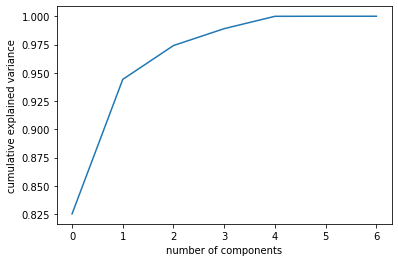

In [ ]:
plt.plot(np.cumsum(temp_pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [ ]:
num_components = 2
pca = PCA(num_components)
X_pca = pca.fit_transform(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
model = TimeSeriesKMeans(n_clusters=3, metric="dtw")
model.fit(X_pca)

TimeSeriesKMeans(metric='dtw')

In [ ]:
centers = model.predict(X_pca)

/usr/local/lib/python3.7/dist-packages/tslearn/utils/utils.py:89: UserWarning:

2-Dimensional data passed. Assuming these are 25202 1-dimensional timeseries



In [ ]:
temp_df['kmeans_dtwpca'] =centers

In [ ]:
fig = px.scatter_3d(temp_df, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='kmeans_dtwpca', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
temp_df.to_csv("pca_dtw.csv")

In [ ]:
!pip install dtaidistance
from dtaidistance import dtw

     |████████████████████████████████| 797 kB 12.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for dtaidistance: filename=dtaidistance-2.3.6-cp37-cp37m-linux_x86_64.whl size=1593630 sha256=453ff3f85f75466b00a2817a8151afee43f3faa832dff5a2956906c1af7f00e3
  Stored in directory: /root/.cache/pip/wheels/a4/04/e5/ff7fd821276e7ec68893652d36b6a13f230ecdcafdc3283b3f
Successfully built dtaidistance


In [ ]:
X_pca

array([[ 0.51305992, -0.18561616],
       [ 0.64937039,  0.11739342],
       [ 0.91872515, -0.2358388 ],
       ...,
       [ 0.21034055, -0.15996081],
       [ 0.20968472, -0.12982304],
       [ 0.10505366, -0.18763777]])

In [ ]:
X_pca[:,1]

array([-0.18561616,  0.11739342, -0.2358388 , ..., -0.15996081,
       -0.12982304, -0.18763777])

In [ ]:
distance = dtw.distance(X_pca[:,0], X_pca[:,1])
print(distance)

18.624528395310254


## KMEANS

In [ ]:
from tslearn.metrics import dtw

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
model = TimeSeriesKMeans(n_clusters=3, metric="dtw")
model.fit(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])

TimeSeriesKMeans(metric='dtw')

In [ ]:
centers = model.predict(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])

In [ ]:
temp_df['kmeans_dtw'] =centers

In [ ]:
fig = px.scatter_3d(temp_df, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='kmeans_dtw', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
fig = px.scatter_3d(temp_df, x = 'julian day', y='avg_temperature', z='min_temperature', hover_name='date',
              color='kmeans_dtw', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
model = TimeSeriesKMeans(n_clusters=3, metric="softdtw")
model.fit(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])

TimeSeriesKMeans(metric='softdtw')

In [ ]:
centers = model.predict(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])

In [ ]:
temp_df['kmeans_softdtw'] =centers

In [ ]:
fig = px.scatter_3d(temp_df, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='kmeans_softdtw', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
fig = px.scatter_3d(temp_df, x = 'julian day', y='avg_temperature', z='min_temperature', hover_name='date',
              color='kmeans_softdtw', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
dist = pairwise_distances(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])
dunn(dist, temp_df['kmeans_dtw'])

0.0012404483034093696

In [ ]:
dist = pairwise_distances(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation','rain','snow']])
dunn(dist, temp_df['kmeans_softdtw'])

0.0012153665223788928

## Hierarchical Clustering

In [ ]:
from matplotlib import pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

In [ ]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
model.fit(temp_df[['min_temperature','max_temperature','avg_temperature','avg_wind_speed', 'precipitation']])
labels = model.labels_

In [ ]:
temp_df['agglomerative']=labels

<ipython-input-32-805b80a85896>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
fig = px.scatter_3d(temp_df, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='agglomerative', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
temp_df.to_csv("aglo.csv")

In [ ]:
fig = px.scatter_3d(temp_df, x = temp_df.index, y='avg_temperature', z='min_temperature', hover_name='date',
              color='agglomerative', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
temp_df.to_csv("new.csv")

##KMEOIDS

In [ ]:
!pip install sklearn_extra.cluster
!pip install scikit-learn-extra

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement sklearn_extra.cluster (from versions: none)
ERROR: No matching distribution found for sklearn_extra.cluster
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 36.8 MB/s eta 0:00:00


In [ ]:
data

,min_temperature,max_temperature,avg_temperature,avg_wind_speed,precipitation,kmeans_dtw,julian_day,date,year,month,day,agglomerative
0,-6.7,0.6,-3.05,13.0,0.0,2,1/1/1953,1/1/1953,1953,1,1,1
1,-1.1,1.7,0.29,9.5,0.0,0,1/2/1953,1/2/1953,1953,1,2,2
2,-2.2,1.7,-0.25,16.0,0.0,0,1/3/1953,1/3/1953,1953,1,3,2
3,-11.7,-2.2,-6.94,14.0,0.0,2,1/4/1953,1/4/1953,1953,1,4,1
4,-6.7,-1.1,-3.90,20.0,0.5,2,1/5/1953,1/5/1953,1953,1,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...
25562,-7.1,-1.4,-4.25,19.0,0.0,2,12/27/2022,12/27/2022,2022,12,27,1
25563,-1.4,4.6,1.60,17.0,0.0,0,12/28/2022,12/28/2022,2022,12,28,2
25564,2.0,9.5,5.75,17.0,0.0,0,12/29/2022,12/29/2022,2022,12,29,2
25565,8.2,13.1,10.64,16.5,5.8,0,12/30/2022,12/30/2022,2022,12,30,2


In [ ]:
from sklearn_extra.cluster import KMedoids

In [ ]:
KMobj = KMedoids(n_clusters=3).fit(data[['min_temperature','max_temperature','avg_temperature','avg_wind_speed','precipitation']])

In [ ]:
labels = KMobj.labels_

In [ ]:
data['kmedoids'] = labels

In [ ]:
data.to_csv("labels.csv")

In [ ]:
fig = px.scatter_3d(data, x = 'avg_temperature', y='max_temperature', z='min_temperature',
              color='kmedoids', opacity = 0.8, size_max=30)
fig.show(renderer="colab")

In [ ]:
fig = px.scatter_3d(data, x = 'julian_day', y='avg_temperature', z='min_temperature',
              color='kmedoids', opacity = 0.8, size_max=30,animation_frame='year', labels={'year,year,year'})
fig.show(renderer="colab",useOffset=False)

In [ ]:
temp_df.to_csv("kmedoids_csv.csv")